Welcome to my notebook! This is a copy/paste welcome message for all my notebooks :) 📓 This repository/notebook serves as a personal reminder for me, documenting code snippets and techniques sourced from various learning resources. The goal is to consolidate valuable information and create a basic reference guide. Please note that the codes included here are not originally mine, and credit goes to the respective authors and resources. Feel free to explore and use this collection as a shared learning space. Happy coding

#### Sources for this notebook : 
    * https://huggingface.co/docs/diffusers/using-diffusers/textual_inversion_inference
    * https://huggingface.co/docs/diffusers/using-diffusers/reusing_seeds
    
#### Purpose :
    * Using textual_inversion
    * Using a deterministic generator for better image
    
#### Keywords :
    * Stable diffusion and XL 
    * textual_inversion
    * seed
    * deterministic generator

''... The StableDiffusionPipeline supports textual inversion, a technique that enables a model like Stable Diffusion to learn a new concept from just a few sample images. This gives you more control over the generated images and allows you to tailor the model towards specific concepts. ...''

### STABLE DIFFUSION 1 AND 2

In [1]:
import torch
from diffusers import StableDiffusionPipeline
from diffusers.utils import make_image_grid

C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [2]:
pretrained_model_name_or_path = "runwayml/stable-diffusion-v1-5"
repo_id_embeds = "sd-concepts-library/cat-toy"

In [3]:
pipeline = StableDiffusionPipeline.from_pretrained(
    pretrained_model_name_or_path, torch_dtype=torch.float16, use_safetensors=True
).to("cuda")

pipeline.load_textual_inversion(repo_id_embeds)

Loading pipeline components...: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


'' ...Create a prompt with the pre-learned concept by using the special placeholder token <cat-toy>, and choose the number of samples and rows of images you’d like to generate...''

In [4]:
pipeline

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.26.2",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [5]:
prompt = "a grafitti in a favela wall with a <cat-toy> on it"

num_samples_per_row = 2
num_rows = 2

  0%|          | 0/50 [00:00<?, ?it/s]C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 50/50 [00:14<00:00,  3.37it/s]


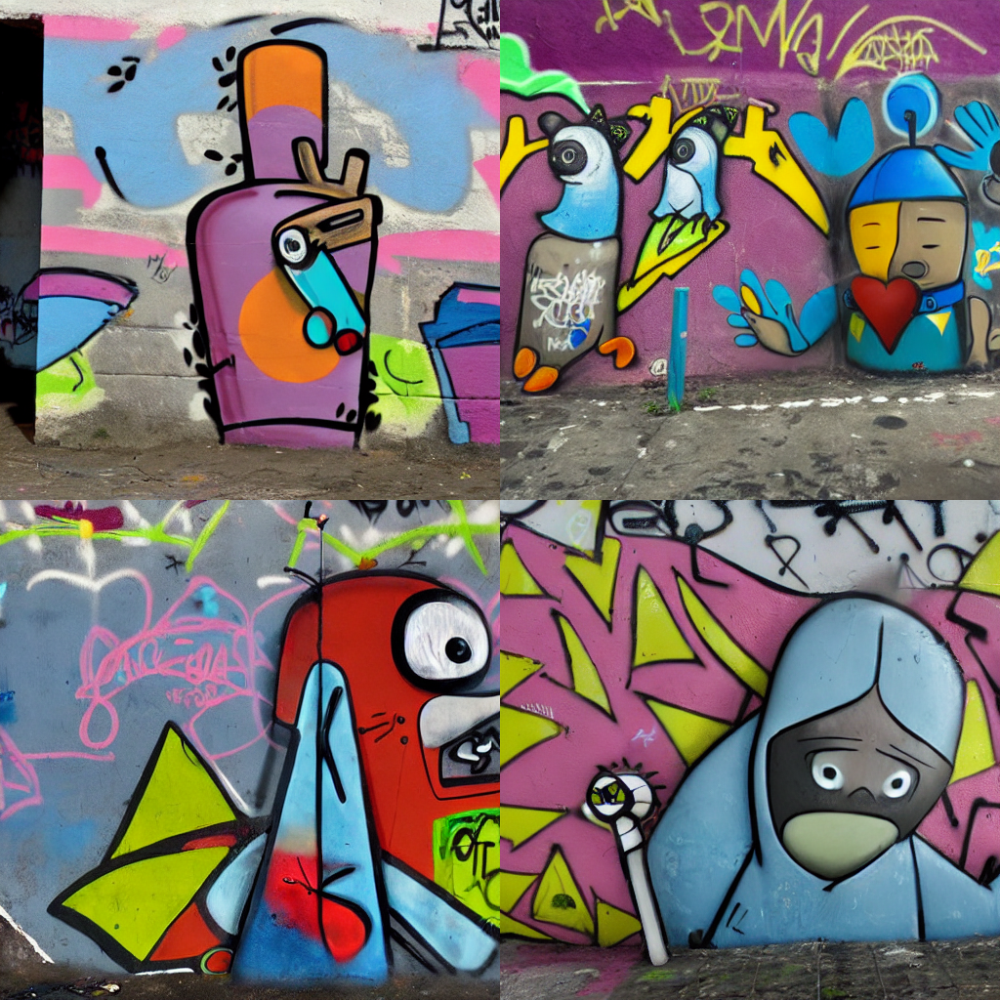

In [6]:
all_images = []
for _ in range(num_rows):
    images = pipeline(prompt, num_images_per_prompt=num_samples_per_row, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = make_image_grid(all_images, num_rows, num_samples_per_row)
grid

### Stable Diffusion XL

In [1]:
from safetensors.torch import load_file

In [2]:
state_dict = load_file('unaestheticXLv31.safetensors')
state_dict

{'clip_g': tensor([[ 0.0077, -0.0112,  0.0065,  ...,  0.0195,  0.0159,  0.0275],
         [ 0.0320, -0.0239,  0.0241,  ..., -0.0164,  0.0284, -0.0135],
         [-0.0303,  0.0069, -0.0071,  ...,  0.0100, -0.0251,  0.0164],
         ...,
         [ 0.0136, -0.0042,  0.0027,  ..., -0.0277, -0.0232, -0.0380],
         [ 0.0121, -0.0066,  0.0176,  ..., -0.0292,  0.0065, -0.0139],
         [-0.0170,  0.0213,  0.0143,  ..., -0.0302, -0.0240, -0.0362]],
        dtype=torch.float16),
 'clip_l': tensor([[ 0.0023,  0.0192,  0.0213,  ..., -0.0385,  0.0048, -0.0011],
         [-0.0079, -0.0240,  0.0062,  ..., -0.0042,  0.0103,  0.0328],
         [ 0.0096,  0.0127,  0.0181,  ..., -0.0076, -0.0272, -0.0204],
         ...,
         [ 0.0210,  0.0003,  0.0207,  ...,  0.0063, -0.0131,  0.0299],
         [ 0.0160, -0.0136,  0.0269,  ...,  0.0242,  0.0356, -0.0205],
         [ 0.0475, -0.0508, -0.0145,  ...,  0.0070, -0.0089, -0.0163]],
        dtype=torch.float16)}

''... There are two tensors, "clip_g" and "clip_l". "clip_g" corresponds to the bigger text encoder in SDXL and refers to pipe.text_encoder_2 and "clip_l" refers to pipe.text_encoder...''

C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
  0%|          | 0/50 [00:00<?, ?it/s]C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (T

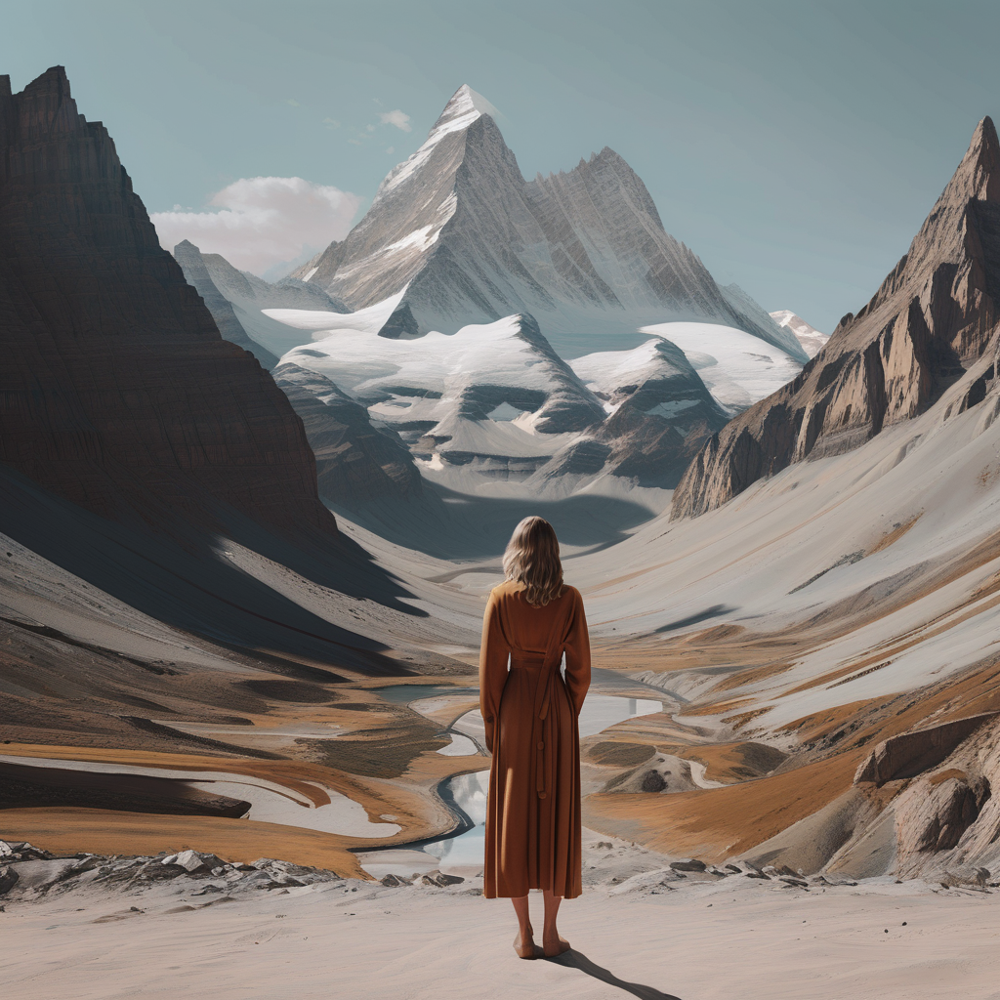

In [3]:
from diffusers import AutoPipelineForText2Image
import torch

pipe = AutoPipelineForText2Image.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16)
pipe.to("cuda")

pipe.load_textual_inversion(state_dict["clip_g"], token="unaestheticXLv31", text_encoder=pipe.text_encoder_2, tokenizer=pipe.tokenizer_2)
pipe.load_textual_inversion(state_dict["clip_l"], token="unaestheticXLv31", text_encoder=pipe.text_encoder, tokenizer=pipe.tokenizer)

# the embedding should be used as a negative embedding, so we pass it as a negative prompt
generator = torch.Generator().manual_seed(33)
image = pipe("a woman standing in front of a mountain", negative_prompt="unaestheticXLv31", generator=generator).images[0]
image

In [4]:
pipe

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.26.2",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [5]:
## you can also download like this

from huggingface_hub import hf_hub_download
from safetensors.torch import load_file

file = hf_hub_download("dn118/unaestheticXL", filename="unaestheticXLv31.safetensors")
state_dict = load_file(file)
state_dict

unaestheticXLv31.safetensors: 100%|██████████| 33.3k/33.3k [00:00<00:00, 296kB/s]


{'clip_g': tensor([[ 0.0077, -0.0112,  0.0065,  ...,  0.0195,  0.0159,  0.0275],
         [ 0.0320, -0.0239,  0.0241,  ..., -0.0164,  0.0284, -0.0135],
         [-0.0303,  0.0069, -0.0071,  ...,  0.0100, -0.0251,  0.0164],
         ...,
         [ 0.0136, -0.0042,  0.0027,  ..., -0.0277, -0.0232, -0.0380],
         [ 0.0121, -0.0066,  0.0176,  ..., -0.0292,  0.0065, -0.0139],
         [-0.0170,  0.0213,  0.0143,  ..., -0.0302, -0.0240, -0.0362]],
        dtype=torch.float16),
 'clip_l': tensor([[ 0.0023,  0.0192,  0.0213,  ..., -0.0385,  0.0048, -0.0011],
         [-0.0079, -0.0240,  0.0062,  ..., -0.0042,  0.0103,  0.0328],
         [ 0.0096,  0.0127,  0.0181,  ..., -0.0076, -0.0272, -0.0204],
         ...,
         [ 0.0210,  0.0003,  0.0207,  ...,  0.0063, -0.0131,  0.0299],
         [ 0.0160, -0.0136,  0.0269,  ...,  0.0242,  0.0356, -0.0205],
         [ 0.0475, -0.0508, -0.0145,  ...,  0.0070, -0.0089, -0.0163]],
        dtype=torch.float16)}

### Improve image quality with deterministic generation

''... A common way to improve the quality of generated images is with deterministic batch generation, generate a batch of images and select one image to improve with a more detailed prompt in a second round of inference. The key is to pass a list of torch.Generator’s to the pipeline for batched image generation, and tie each Generator to a seed so you can reuse it for an image....''

In [1]:
prompt = "Labrador in the style of Vermeer"

In [2]:
import torch
from diffusers import DiffusionPipeline
from diffusers.utils import make_image_grid

pipe = DiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, use_safetensors=True
)
pipe = pipe.to("cuda")

C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
Loading pipeline components...: 100%|██████████| 7/7 [00:07<00:00,  1.14s/it]


In [3]:
generator = [torch.Generator(device="cuda").manual_seed(i) for i in range(4)]

  0%|          | 0/50 [00:00<?, ?it/s]C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


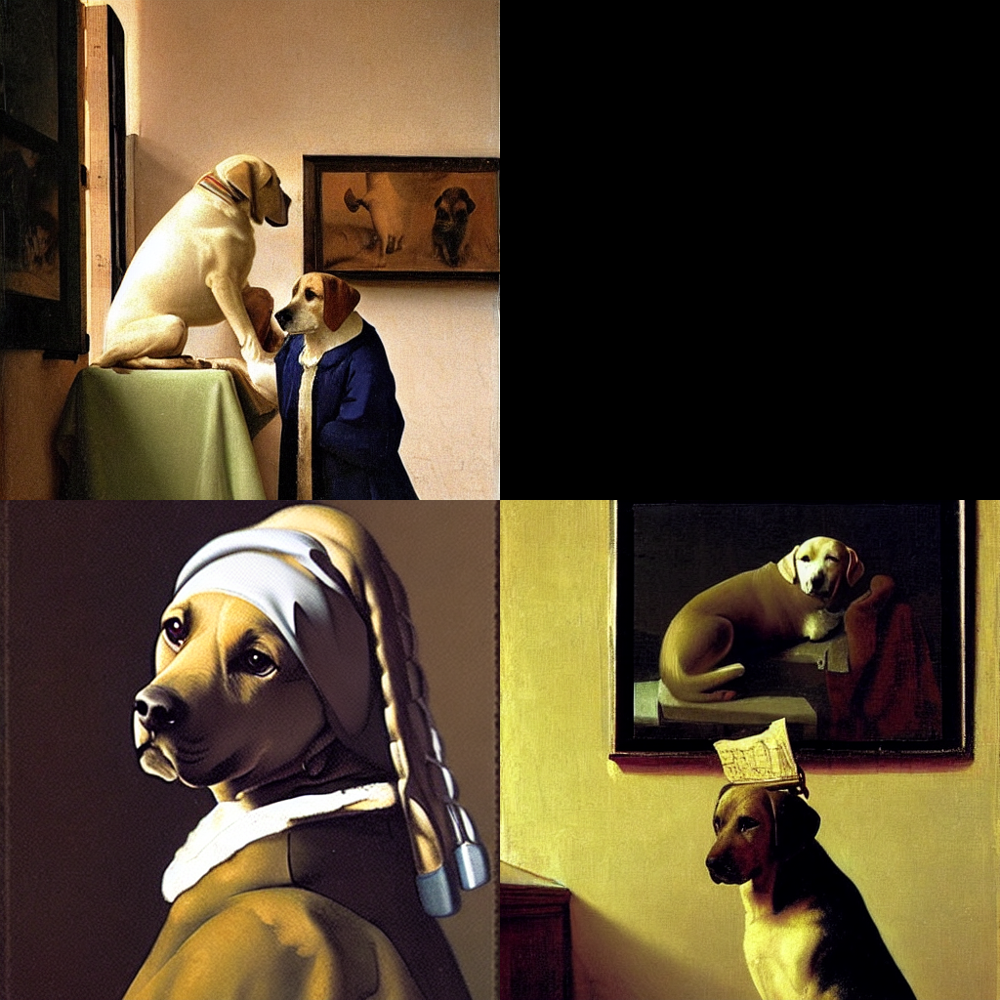

In [4]:
images = pipe(prompt, generator=generator, num_images_per_prompt=4).images
make_image_grid(images, rows=2, cols=2)

''... The first image used the Generator with seed 3, so you’ll reuse that Generator for the second round of inference. To improve the quality of the image, add some additional text to the prompt...''

In [5]:
prompt = [prompt + t for t in [", highly realistic", ", artsy", ", trending", ", colorful"]]


In [6]:
prompt

['Labrador in the style of Vermeer, highly realistic',
 'Labrador in the style of Vermeer, artsy',
 'Labrador in the style of Vermeer, trending',
 'Labrador in the style of Vermeer, colorful']

In [9]:
generator = [torch.Generator(device="cuda").manual_seed(3) for i in range(4)]

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]


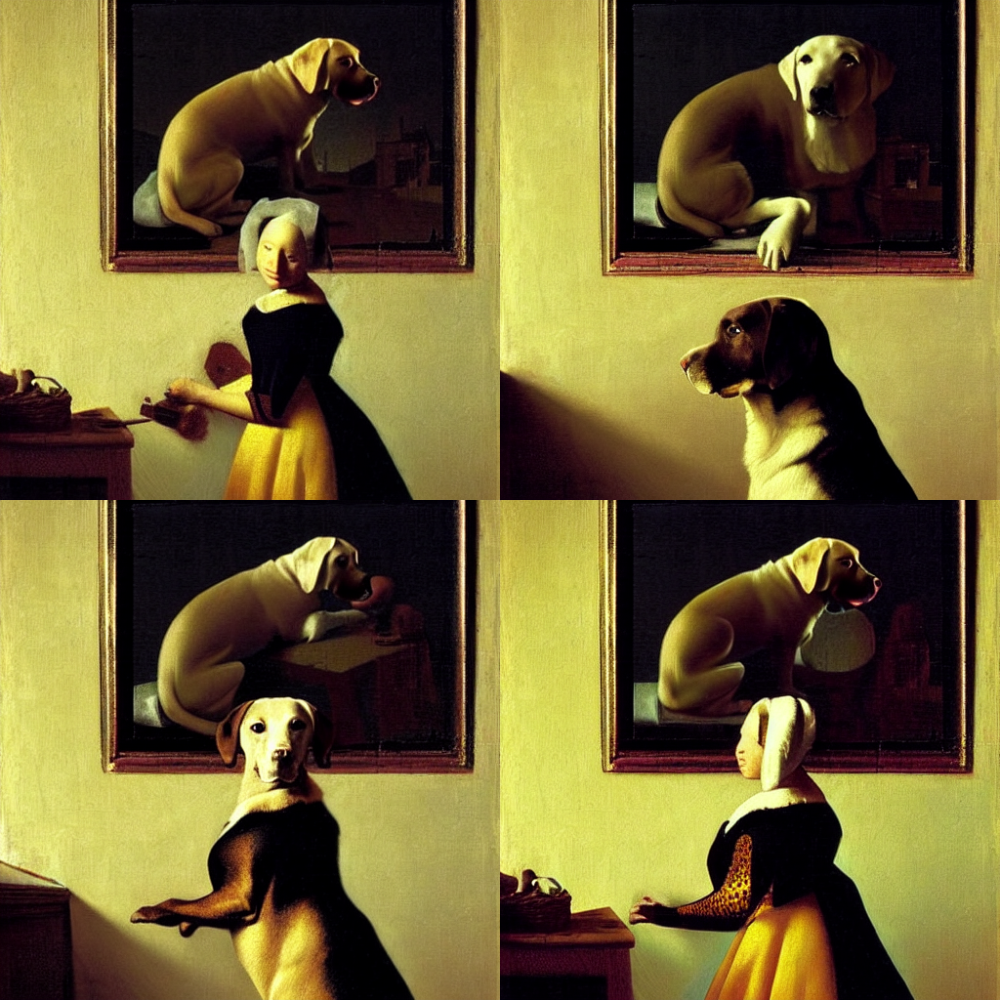

In [10]:
images = pipe(prompt, generator=generator).images
make_image_grid(images, rows=2, cols=2)